In [1]:
%matplotlib inline
# %matplotlib qt
# import mpld3
# mpld3.enable_notebook() # seems to just freeze the stuff a bit
# import matplotlib
# matplotlib.use('nbagg') # also slow AF

In [164]:
from __future__ import print_function, division
import os, sys
import numpy as np, scipy as sp
import scipy.io
import scipy.signal as signal
import scipy.stats
import scipy.fftpack as ftpk
import matplotlib.pyplot as plt
import matplotlib

In [3]:
e = np.exp(1)
pi = np.pi
pii = np.pi*1j
twopi = np.pi * 2

In [21]:
import pywt
import pyhht
import pyhht.emd

In [5]:
from imp import reload
import auxfilter
import glob

In [6]:
# os.chdir('..')
os.chdir('/home/mike/venvs/ml/ml/py')
print(os.getcwd())
from eegkaggle.vectorizers import naive, spectral
from eegkaggle.dio import dataio
from eegkaggle.plotting import plotstuff
from eegkaggle.msignal import wavelets, metrics

/home/mike/venvs/ml/ml/py


In [187]:
reload(plotstuff)
reload(spectral)

<module 'eegkaggle.vectorizers.spectral' from 'eegkaggle/vectorizers/spectral.py'>

In [8]:
matplotlib.style.use('ggplot')

In [9]:
ssmall,smed, slarge, slong = (4,3), (8,6), (16,12), (16,4)
matplotlib.rcParams['figure.figsize'] = slong

Functions

In [10]:
# this needs to be here because...reasons?
def pltcwt(plt, my_cwt, widths, realize=None):
    hi = np.max(widths)
    lo = np.min(widths)
    if realize == 'abs':
        my_cwt = np.abs(my_cwt)
    elif realize == 'ang':
        my_cwt = np.angle(my_cwt)
    plt.imshow(my_cwt, extent=[-1, 1, hi, lo], cmap='seismic', aspect='auto',
               vmax=abs(my_cwt).max(), vmin=-abs(my_cwt).max())


def plt_easycwt(plt, sig, widths):
    my_cwt = signal.cwt(sig, signal.ricker, widths)
    pltcwt(plt, my_cwt, widths)

Data loading section

In [12]:
basepath = '/home/mike/Downloads/train_1/'
sources1 = glob.glob(basepath + '*_1.mat') 
sources0 = glob.glob(basepath + '*_0.mat') 

basepathT = '/media/mike/Elements/data/kaggle/melbourne/test_3/'
basepathT = '/home/mike/Downloads/test_1_new/'

sourcesT = glob.glob(basepath + '*.mat') 


In [154]:
basepath = '/home/mike/Downloads/train_1/'
path = basepath + '1_100_0.mat'
nfile=120
nfile2=100
rawdata = dataio.get_matlab_eeg_data(sources0[nfile])
data = rawdata['data']
data1=dataio.get_matlab_eeg_data_ary(sources1[nfile2])
print(data.shape)
SR = rawdata['iEEGsamplingRate'][0][0]
if SR == int(SR):
    SR = int(SR)
print(SR)

(240000, 16)
400


In [57]:
brief = data[:SR*120]
brief.shape
bb = brief

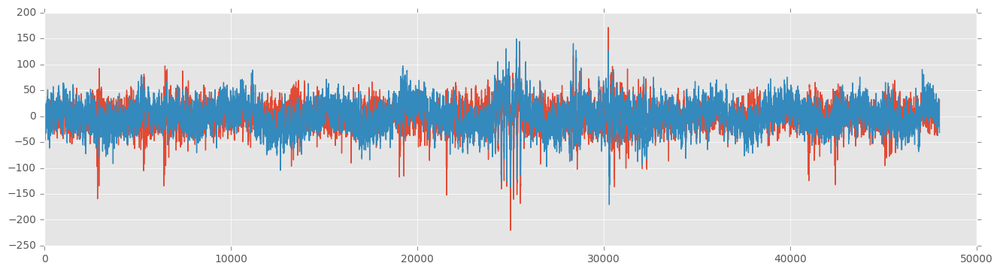

In [58]:
plt.plot(brief[:,:2])

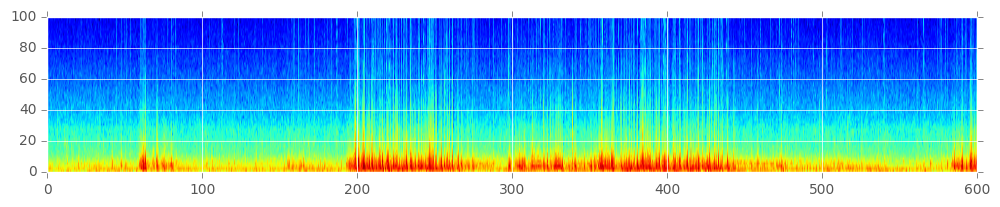

In [151]:
spec0 = spectral.file_to_fig(sources0[nfile], returnspec=1)

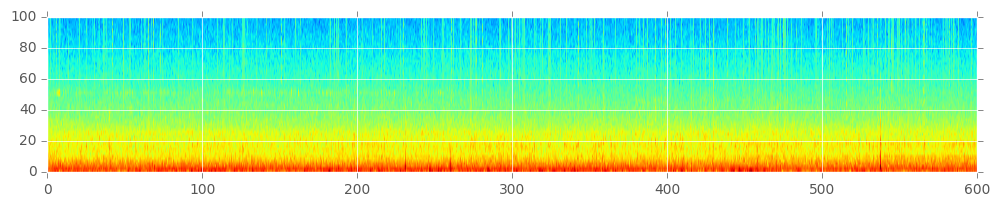

In [152]:
spec1 = spectral.file_to_fig(sources1[100], returnspec=1)

In [63]:
eeg1 = brief[:,0]
eeg2 = brief[:,1]

In [64]:
lo, hi = 1, 16
nbins = 32
widths = np.linspace(lo, hi, nbins)**2

In [65]:
data.shape

(240000, 16)

In [66]:
sig = data[:, 0]
fsig = ftpk.fft(data, axis=0)
t = np.linspace(0, 400, len(fsig))

fsig.shape


(240000, 16)

In [69]:
decomposer = pyhht.emd.EMD(eeg1)
imfs = decomposer.decompose()

Mode 5, Iteration 600
3 minima > 0; 940 maxima < 0.


In [70]:
imfs = imfs.T
imfs.shape

(48000, 15)

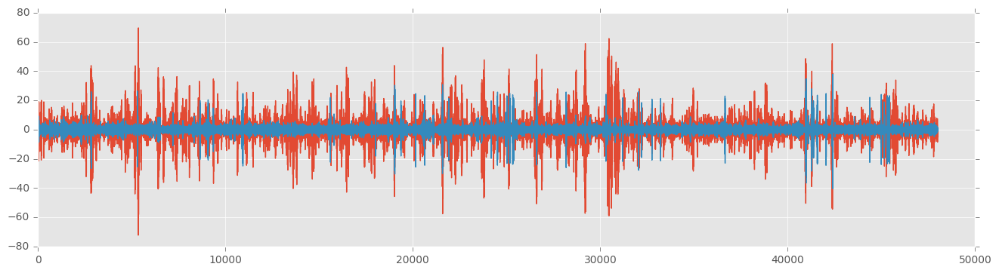

In [71]:
plt.plot(imfs[:,1])
plt.plot(imfs[:,0])

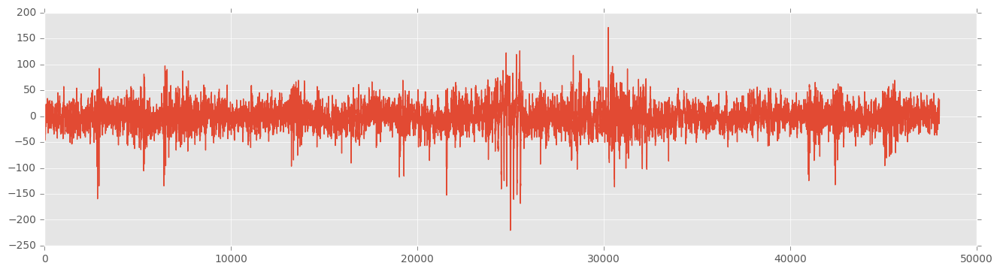

In [72]:
plt.plot(eeg1)

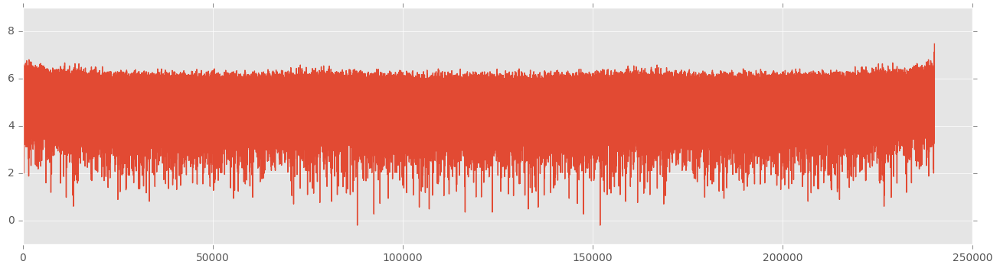

In [75]:
plt.plot(np.log(np.abs(ftpk.fft(np.average(data, axis=1)))))

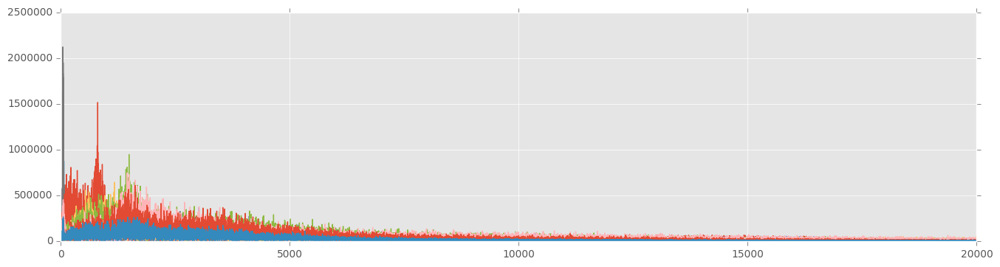

In [80]:
plt.plot(np.abs(ftpk.fft(data, axis=0)[:20000]))

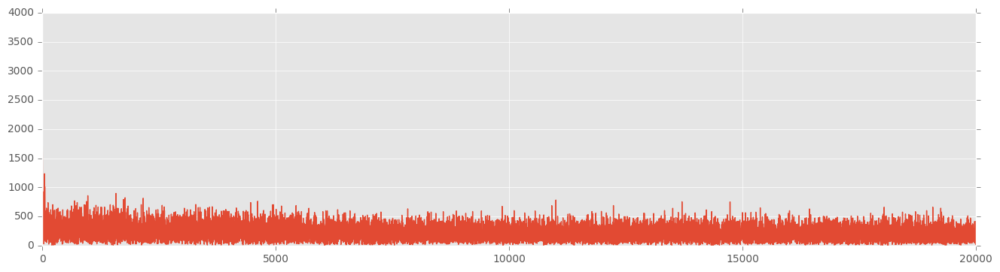

In [85]:
plt.plot(np.abs(ftpk.fft(np.average(data,axis=1), axis=0)[:20000]))

# Huh. Averaging the channels before spectral analysis obliterates the frequency components

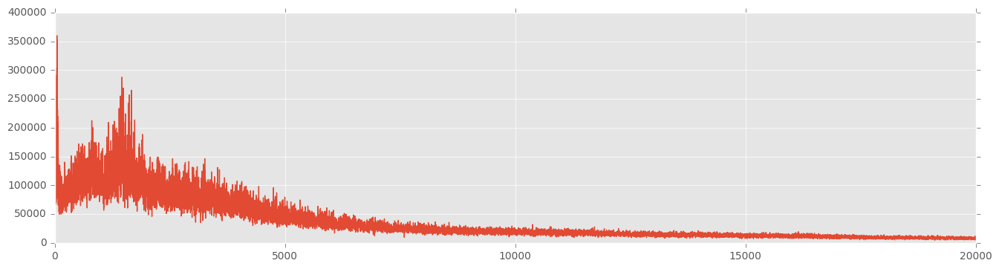

In [82]:
plt.plot(np.average(np.abs(ftpk.fft(data, axis=0)[:20000]), axis=1))

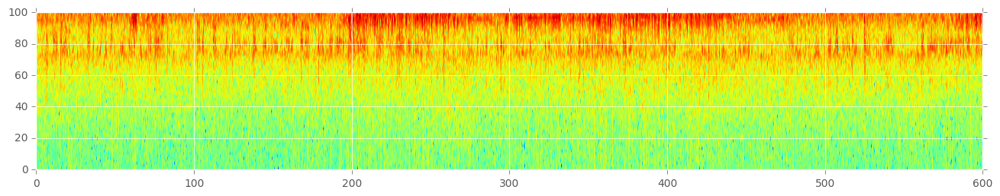

In [97]:
# spec0[:,:,1].shape
# plt.imshow(spec0[:,:,0].T)
aspec0 = np.average(spec0[:,:], axis=2).T
aspec0.shape

plt.imshow(spec0[:,:,0].T, extent=[0,600,0,100])

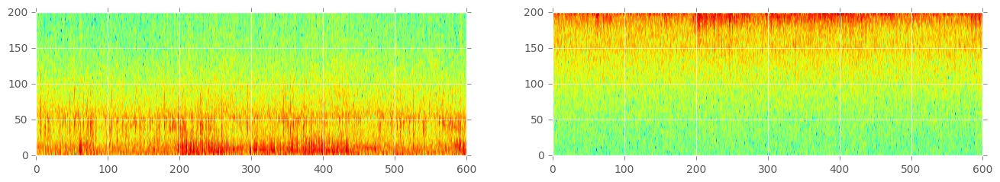

In [108]:
matplotlib.rcParams['figure.figsize'] = (16,16)
fig = plt.figure()
fig.add_subplot(1,2,1)
plt.imshow(spec0[:,:,0].T, extent=[0,600,0,200], origin='lower')
fig.add_subplot(122)
plt.imshow(spec0[:,:,1].T, extent=[0,600,0,200])

# Plotting 16

/home/mike/venvs/ml/ml/lib/python2.7/site-packages/ipykernel/__main__.py:7: RuntimeWarning: invalid value encountered in power


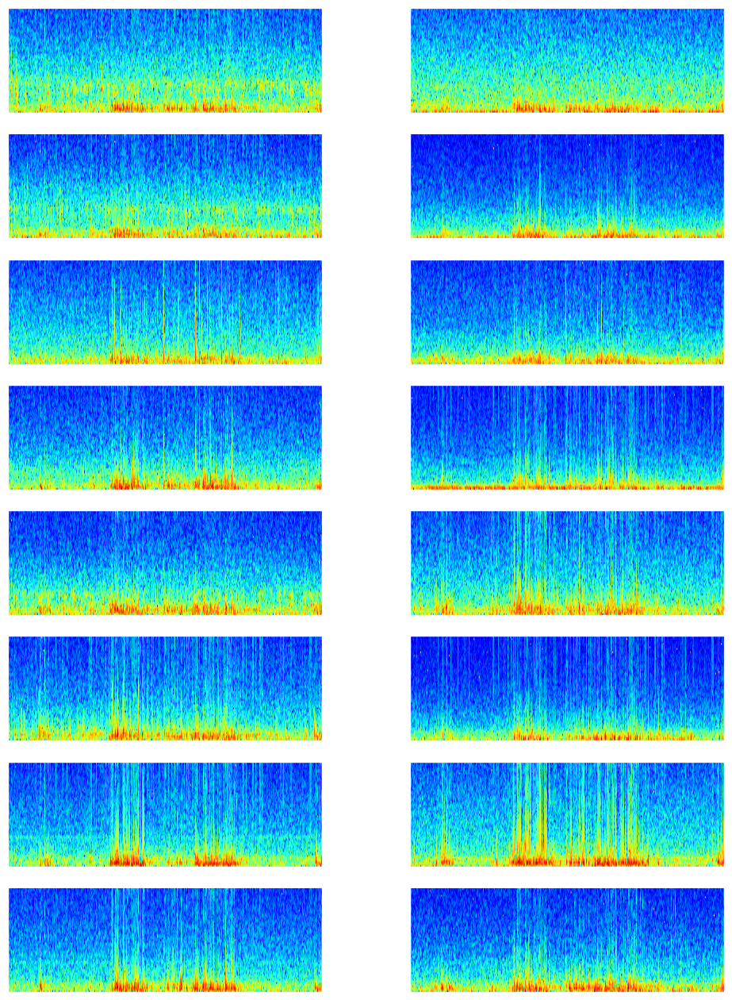

In [121]:
matplotlib.rcParams['figure.figsize'] = (12,16)
fig = plt.figure()
nmax=16
npow=1.5
for i in range(nmax):
    fig.add_subplot(nmax//2,2,i+1)
    plt.imshow(spec0[:,:,i].T**npow, extent=[0,600,0,200], origin='lower')
    ax = plt.gca()
    ax.get_yaxis().set_visible(False)
    ax.get_xaxis().set_visible(False)


/home/mike/venvs/ml/ml/lib/python2.7/site-packages/ipykernel/__main__.py:7: RuntimeWarning: invalid value encountered in power


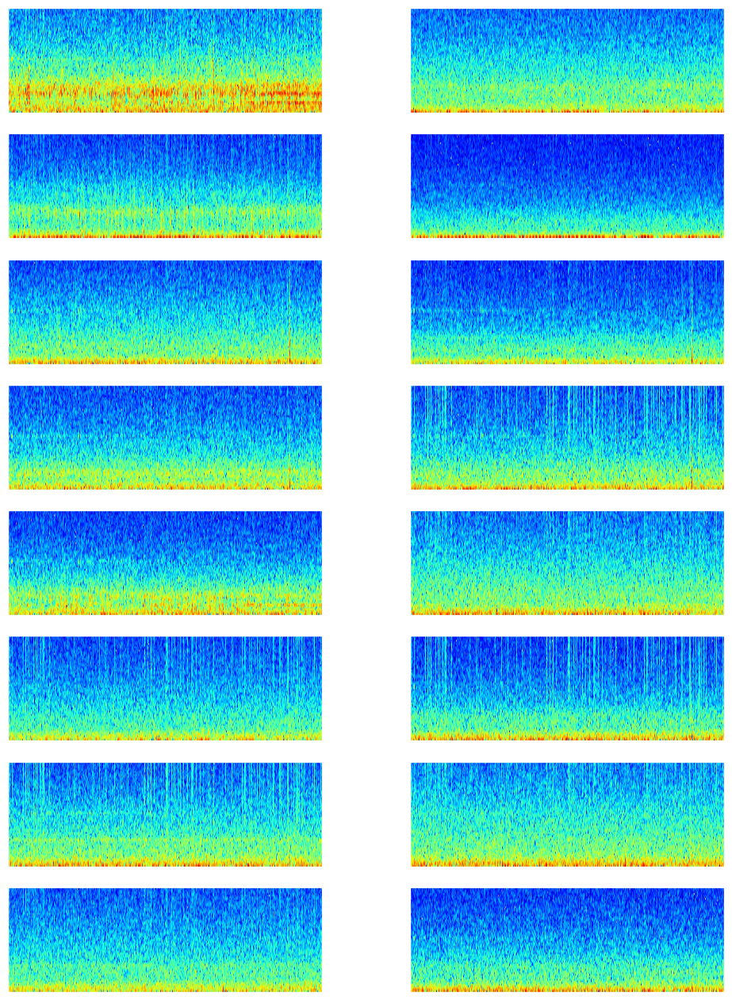

In [153]:
matplotlib.rcParams['figure.figsize'] = (12,16)
fig = plt.figure()
nmax=16
npow=1.5
for i in range(nmax):
    fig.add_subplot(nmax//2,2,i+1)
    plt.imshow(spec1[:,:,i].T**npow, extent=[0,600,0,200], origin='lower')
    ax = plt.gca()
    ax.get_yaxis().set_visible(False)
    ax.get_xaxis().set_visible(False)


0.183266628837 0.0114541643023 0.330694838083


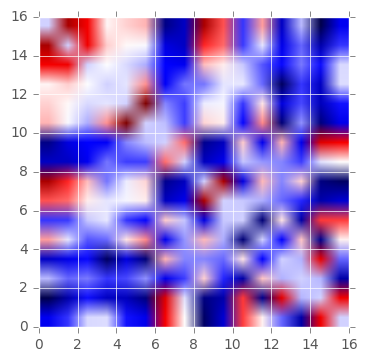

In [162]:
cc = np.corrcoef(data, rowvar=0)
cc.shape
matplotlib.rcParams['figure.figsize'] = (4,4)
# print(np.round(10*cc**2, 1))
# plt.imshow(cc, extent=[-.5,15.5,-.5,15.5], origin='upper')
plt.imshow(cc - np.identity(16), extent=[0,16,0,16], origin='upper', cmap='seismic')
print(np.sum(cc)/16, np.mean(cc), np.std(cc))


0.287927030585 0.0179954394116 0.295280419842


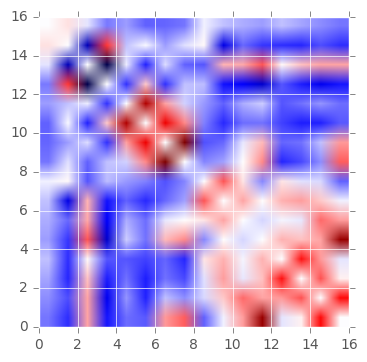

In [163]:
cc = np.corrcoef(data1, rowvar=0)
plt.imshow(cc - np.identity(16), extent=[0,16,0,16], origin='upper', cmap='seismic')
print(np.sum(cc)/16, np.mean(cc), np.std(cc))

In [161]:
scipy.stats.test()

1.56996587031 1.54545454545


In [167]:
adata = signal.hilbert(data, axis=0)
adata1 = signal.hilbert(data1, axis=1)
adata.shape

(240000, 16)

(0, 600000)

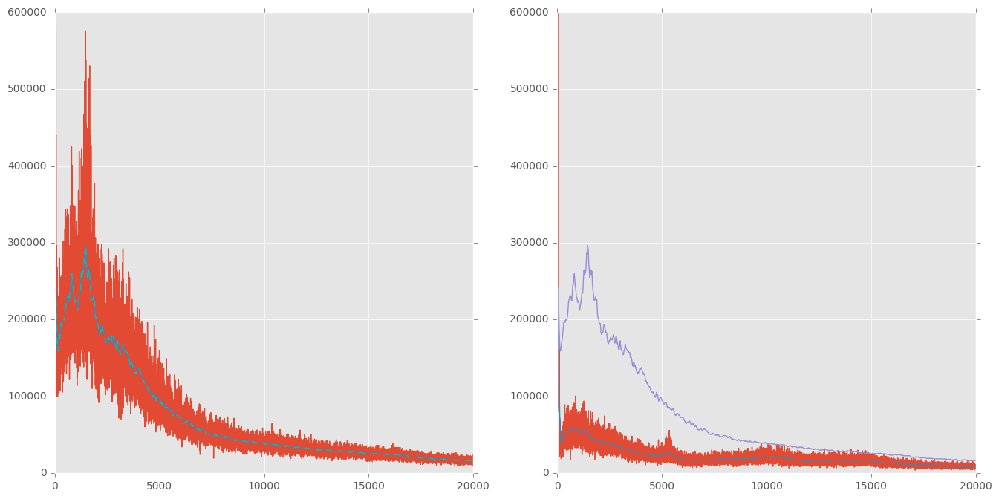

In [181]:
matplotlib.rcParams['figure.figsize'] = (16,8)
fig = plt.figure()
f_data = np.average(np.abs(ftpk.fft(data, axis=0)[:20000]), axis=1)
f_data1 = np.average(np.abs(ftpk.fft(data1, axis=0)[:20000]), axis=1)

f_adata = np.average(np.abs(ftpk.fft(adata, axis=0)[:20000]), axis=1)
f_adata1 = np.average(np.abs(ftpk.fft(adata1, axis=0)[:20000]), axis=1)
cut = .005
ff_data = auxfilter.butterfilt(f_data, cutoff=cut)
ff_data1 = auxfilter.butterfilt(f_data1, cutoff=cut)
ff_adata = auxfilter.butterfilt(f_adata, cutoff=cut)
ff_adata1 = auxfilter.butterfilt(f_adata1, cutoff=cut)

fig.add_subplot(121)
plt.plot(f_adata)
plt.plot(ff_adata)
plt.plot(ff_data*2, 'c--')
plt.ylim(0,600000)
fig.add_subplot(122)
plt.plot(f_adata1)
plt.plot(ff_adata1)
plt.plot(ff_adata)
plt.ylim(0,600000)
plt.ylim(0,600000)

(-2, 2)

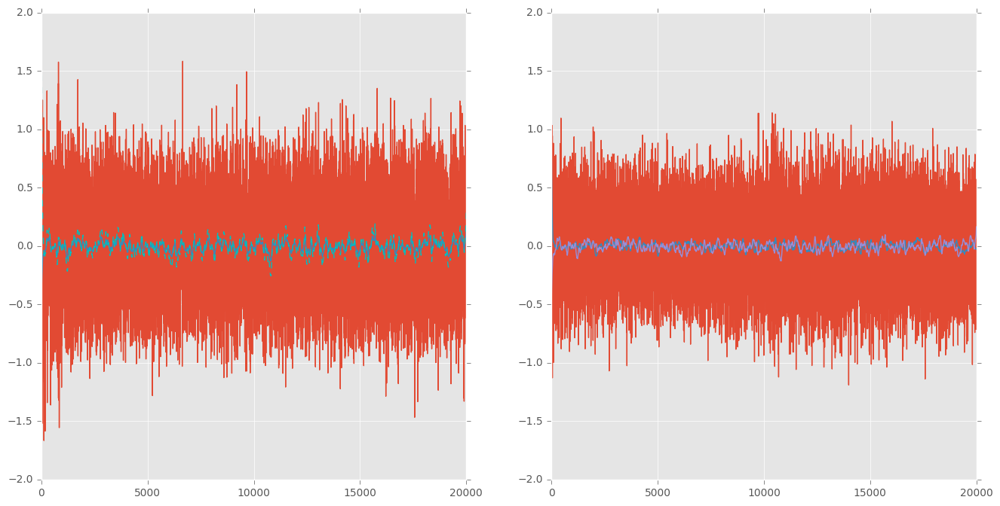

In [185]:
fig = plt.figure()
f_data = np.average(np.angle(ftpk.fft(data, axis=0)[:20000]), axis=1)
f_data1 = np.average(np.angle(ftpk.fft(data1, axis=0)[:20000]), axis=1)

f_adata = np.average(np.angle(ftpk.fft(adata, axis=0)[:20000]), axis=1)
f_adata1 = np.average(np.angle(ftpk.fft(adata1, axis=0)[:20000]), axis=1)
cut = .005
ff_data = auxfilter.butterfilt(f_data, cutoff=cut)
ff_data1 = auxfilter.butterfilt(f_data1, cutoff=cut)
ff_adata = auxfilter.butterfilt(f_adata, cutoff=cut)
ff_adata1 = auxfilter.butterfilt(f_adata1, cutoff=cut)

fig.add_subplot(121)
plt.plot(f_adata)
plt.plot(ff_adata)
plt.plot(ff_data*2, 'c--')
plt.ylim(-2,2)

fig.add_subplot(122)
plt.plot(f_adata1)
plt.plot(ff_adata1)
plt.plot(ff_adata)
plt.ylim(-2,2)


In [186]:
print(np.std(f_data), np.std(f_data1))

0.385183 0.386137


### Phase Angle is pretty much noise

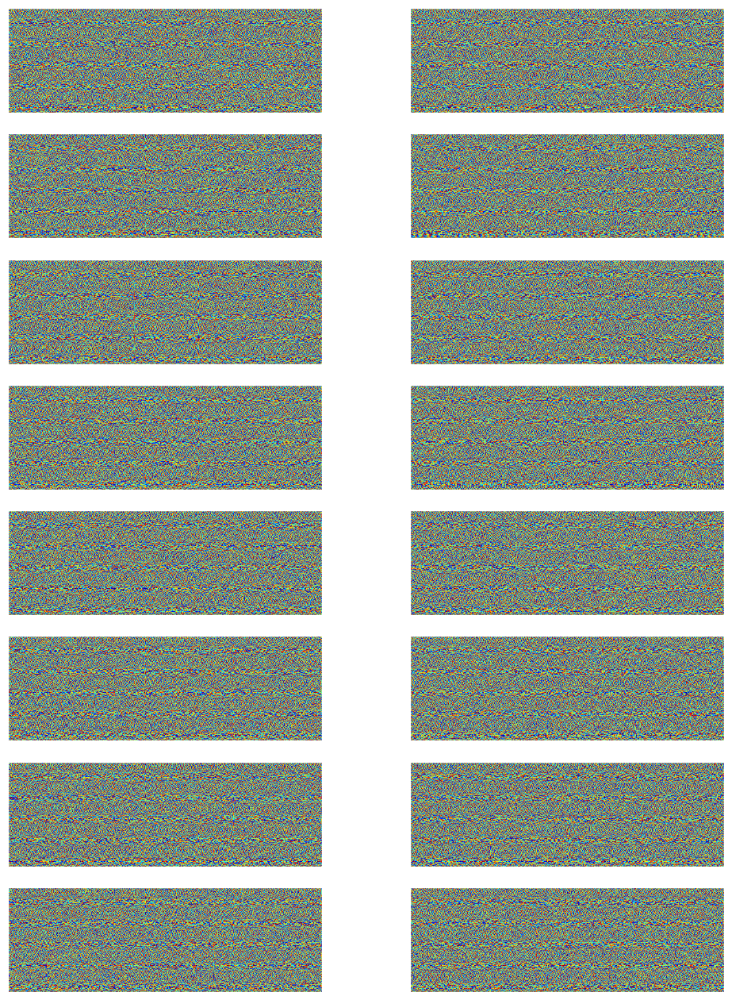

In [189]:
pspec0 =spectral.spectrogram(data, mode='phase')
spectral.plt_16x(plt, pspec0)

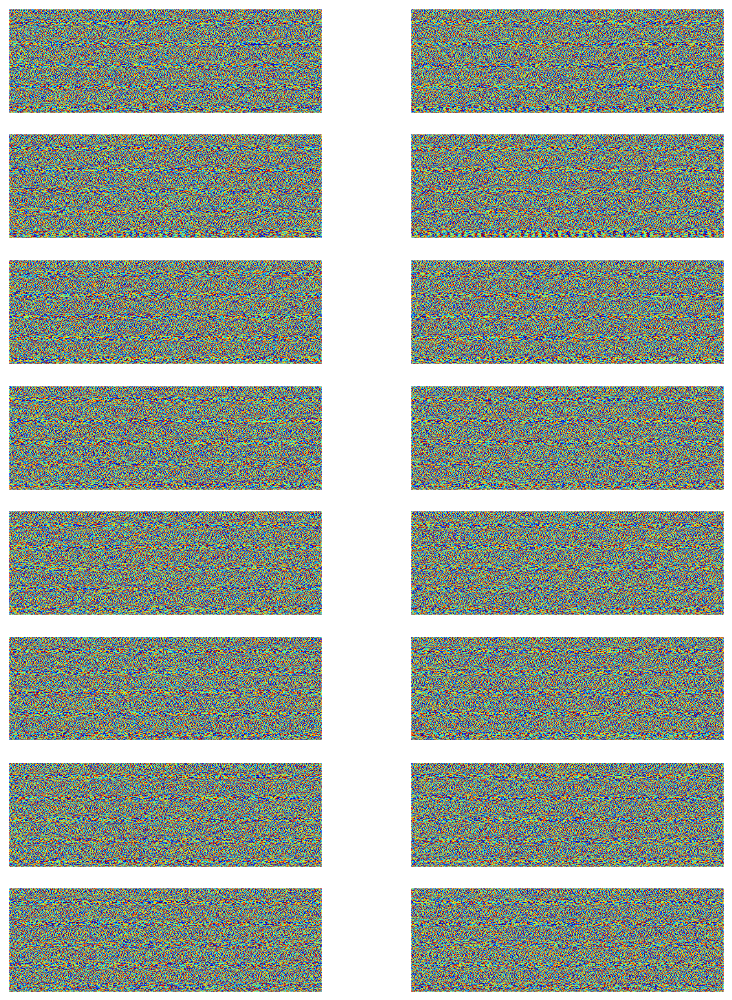

In [190]:
pspec1 =spectral.spectrogram(data1, mode='phase')
spectral.plt_16x(plt, pspec1)